# Importing packages

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib
matplotlib.style.use("ggplot")
import pandas as pd
import random as rand
import string
import math
chars = string.ascii_uppercase + string.digits
%matplotlib inline
plt.rcParams["figure.figsize"] = (16,8)
import seaborn as sns
import sklearn as skl
import skimage as ski
from sklearn.preprocessing import LabelEncoder
from scipy import spatial
from sklearn.utils import shuffle
from os import system
import skimage as ski
from skimage.color import rgb2gray
from scipy import misc
from skimage.exposure import adjust_gamma
from sklearn import preprocessing
from scipy import stats
from glob import glob

# importing and formating the tables

In [38]:
file1 = pd.read_csv('twelve.species.2017.ultimate.txt' , sep= "	")
file1['segmentSize']= file1['posterior']- file1['anterior']
file1.tail()

,species,larva,segment,anterior,posterior,denticle.width,segmentSize
11587,Dyak,143,A4,52.60,56.33,3.73,3.73
11588,Dyak,143,A5,60.08,63.60,3.52,3.52
11589,Dyak,143,A6,67.58,71.09,3.51,3.51
11590,Dyak,143,A7,74.74,78.33,3.59,3.59
11591,Dyak,143,A8,82.43,84.63,2.20,2.20


In [35]:
file1['segPosAvg']= (file1['posterior']+ file1['anterior'])/2

In [37]:
file1.head()

,species,larva,segment,anterior,posterior,denticle.width,segmentSize,segPosAvg
0,Dana,1,A1,31.23,32.82,1.59,1.59,32.025
1,Dana,1,A2,37.94,41.33,3.39,3.39,39.635
2,Dana,1,A3,45.86,49.07,3.21,3.21,47.465
3,Dana,1,A4,53.30,56.41,3.11,3.11,54.855
4,Dana,1,A5,60.60,63.74,3.14,3.14,62.170


In [3]:
a = file1[(file1['segment'] == 'A8' )& (file1['species']== 'Dmoj')]
a['segmentSize'].mean()

1.6854545454545458

In [4]:
file2 = pd.read_csv('twelve.species.2017.fullbodylength.txt', sep ='	')
file2.head()
file2[(file2.species == 'Dana')  & (file2.larva == 1)]['body.length'].values[0]

6081

In [5]:
populations = {}
for spe in file1.species.unique():
    populations[spe] = file1[file1.species == spe]
print(populations['Dana'].head())
species_list = list(populations.keys())
species_list = ['Dsim', 'Dsec', 'Dmel', 'Dyak', 'Dere', 'Dana','Dpse', 'Dper', 'Dwil', 'Dvir', 'Dmoj']
segments_names = populations['Dana'].segment.unique()

    

  species  larva segment  anterior  posterior  denticle.width  segmentSize
0    Dana      1      A1     31.23      32.82            1.59         1.59
1    Dana      1      A2     37.94      41.33            3.39         3.39
2    Dana      1      A3     45.86      49.07            3.21         3.21
3    Dana      1      A4     53.30      56.41            3.11         3.11
4    Dana      1      A5     60.60      63.74            3.14         3.14


## trying to organize the data and not failing anymore :)

In [6]:
%%time
newpop = {}
for spe in species_list:
    tmpDF = pd.DataFrame()
    for larva in populations[spe].larva.unique():
        tmpDF2 = pd.DataFrame()
        for seg in segments_names:
            afly = populations[spe][populations[spe].larva == larva]
            tmpDF2[seg] = pd.Series([afly[afly.segment == seg].segmentSize.values[0] 
                                     * file2[(file2.species == spe)  & (file2.larva == larva)]['body.length'].values[0]])
            #tmpDF2['D.width'+seg] = pd.Series(afly[afly.segment == seg].segmentSize.values)
        tmpDF = pd.concat([tmpDF, tmpDF2])
    newpop[spe] = tmpDF.reset_index(drop=True)
    
    

CPU times: user 23.5 s, sys: 54.9 ms, total: 23.5 s
Wall time: 23.6 s


{'Dsim': 'seagreen', 'Dsec': 'g', 'Dmel': 'darkgreen', 'Dyak': 'lime', 'Dere': 'aquamarine', 'Dana': 'c', 'Dpse': 'dodgerblue', 'Dper': 'b', 'Dwil': 'darkorange', 'Dvir': 'r', 'Dmoj': 'firebrick'}


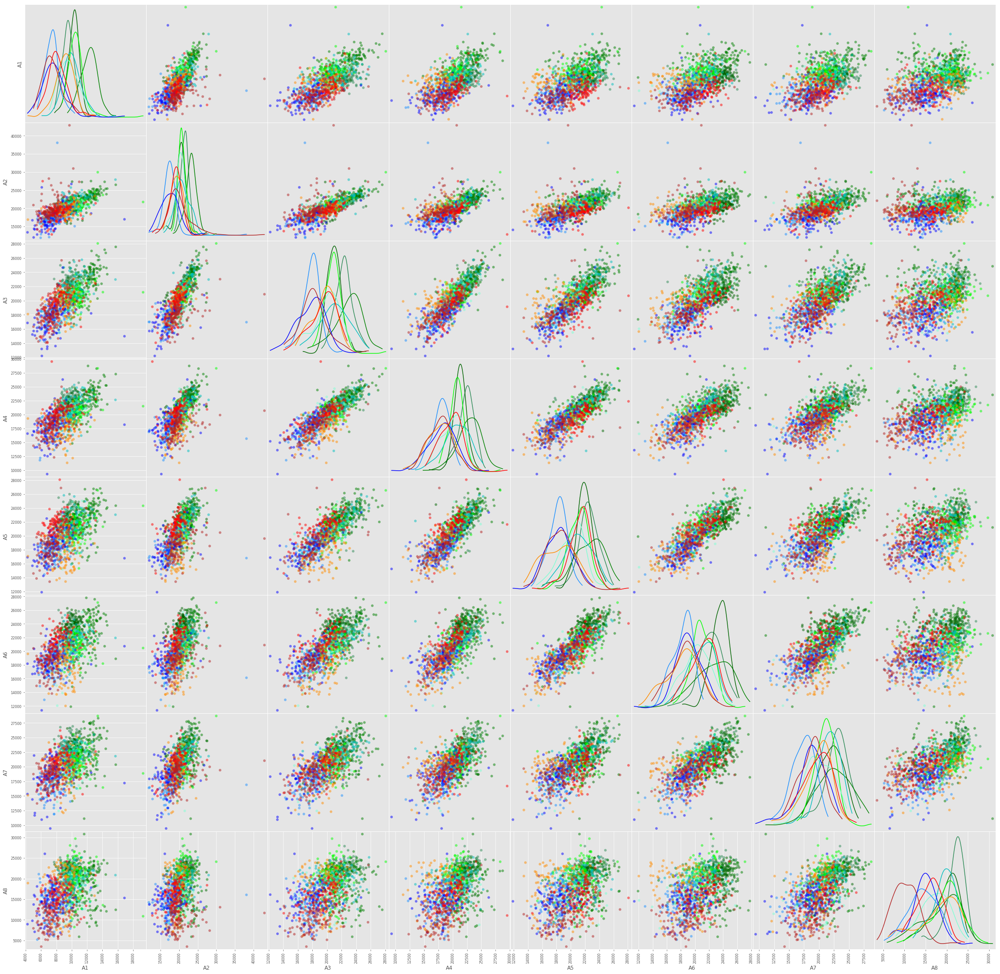

In [7]:
from prettyplot import *
color = ['seagreen','g' ,'darkgreen', 'lime', 'aquamarine', 'c','dodgerblue', 'b', 'darkorange', 'r', 'firebrick']

for i in species_list:
    newpop[i]['species'] = newpop[i].A1.apply(lambda x:i)
axarr, color_map = factor_scatter_matrix(pd.concat([newpop[i] for i in species_list]).reset_index(drop = True),'species', color)
plt.savefig('plots/scatterplotmatrixnonnormalized')


for i in species_list:
    newpop[i] = newpop[i].drop(['species'],axis =1 )
    
print(color_map)


# normalize the variables

In [8]:
### first normalization test
#for spe in species_list:
#    newpop[spe] =newpop[spe].apply(lambda x: (x - x.mean())/x.std(), axis=0)
    
    

In [9]:
newpop['Dana'].head()

,A1,A2,A3,A4,A5,A6,A7,A8
0,9668.79,20614.59,19520.01,18911.91,19094.34,20310.54,20492.97,19398.39
1,12889.60,20962.56,20962.56,23336.96,22929.92,22794.24,25507.84,21912.32
2,12217.00,20511.70,21283.30,20061.60,22955.10,23855.30,21797.70,22119.20
3,9921.42,20074.92,16303.62,17115.90,15897.48,17464.02,16941.84,14446.98
4,10424.80,20598.40,18463.20,18337.60,19593.60,20410.00,22482.40,22482.40


In [10]:
newpop2 = newpop.copy()
for i in species_list:
    newpop2[i]['species'] = newpop2[i].A1.apply(lambda x:i)
allpops = pd.concat([newpop2[i] for i in species_list]).reset_index(drop = True)

df_num = allpops.select_dtypes(include=[np.number])
df_norm = df_num.apply(lambda x: (x - x.mean())/x.std(), axis=0)
allpops[df_norm.columns] = df_norm

for i in species_list:
    newpop[i] = allpops[allpops['species'] == i]


allpops.head()

,A1,A2,A3,A4,A5,A6,A7,A8,species
0,-0.821998,0.035876,0.154787,0.303394,0.392079,-0.160591,-0.955955,0.364169,Dsim
1,0.421964,0.613187,0.760369,0.686752,0.684573,0.070276,0.537490,1.314152,Dsim
2,-0.199451,0.113372,0.319490,0.594049,0.533541,0.170009,0.709112,1.386076,Dsim
3,-0.254375,0.251086,0.311578,0.263005,0.392903,0.473014,0.660856,0.996509,Dsim
4,0.355832,0.200791,0.862191,0.943722,0.530049,0.562774,0.795959,1.166467,Dsim


# calculating mean phenotype vector for each species

In [11]:
MeanPheVectorAllSpe = {}
for spe in species_list:
    MeanPheVectorAllSpe[spe] = newpop[spe].iloc[:, :].mean(axis=0)
MeanPheVectorAllSpe['Dvir']

A1   -0.645273
A2   -0.457451
A3   -0.303946
A4   -0.098944
A5    0.350285
A6    0.213828
A7   -0.204248
A8   -0.303970
dtype: float64

# calculationg correlation between segments for whole population

In [12]:
from pandas.plotting import scatter_matrix
#a = scatter_matrix(allpops, diagonal='kde', figsize = (30,30));

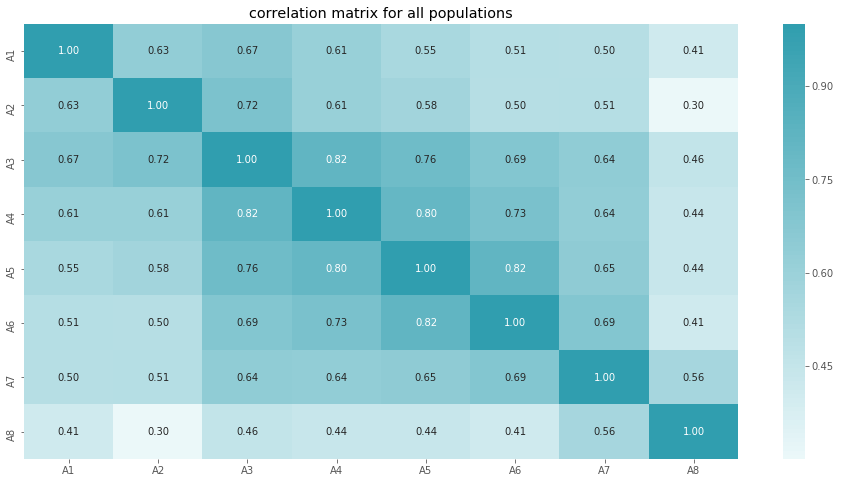

In [13]:
sns.heatmap(allpops.corr(), annot=True, fmt=".2f", cmap = sns.light_palette((210, 90, 60), input="husl", n_colors=100))#sns.color_palette("GnBu_d", n_colors=100)
plt.title('correlation matrix for all populations')
plt.savefig('plots/correlation matrix for all populations')


{'Dsim': 'seagreen', 'Dsec': 'g', 'Dmel': 'darkgreen', 'Dyak': 'lime', 'Dere': 'aquamarine', 'Dana': 'c', 'Dpse': 'dodgerblue', 'Dper': 'b', 'Dwil': 'darkorange', 'Dvir': 'r', 'Dmoj': 'firebrick'}


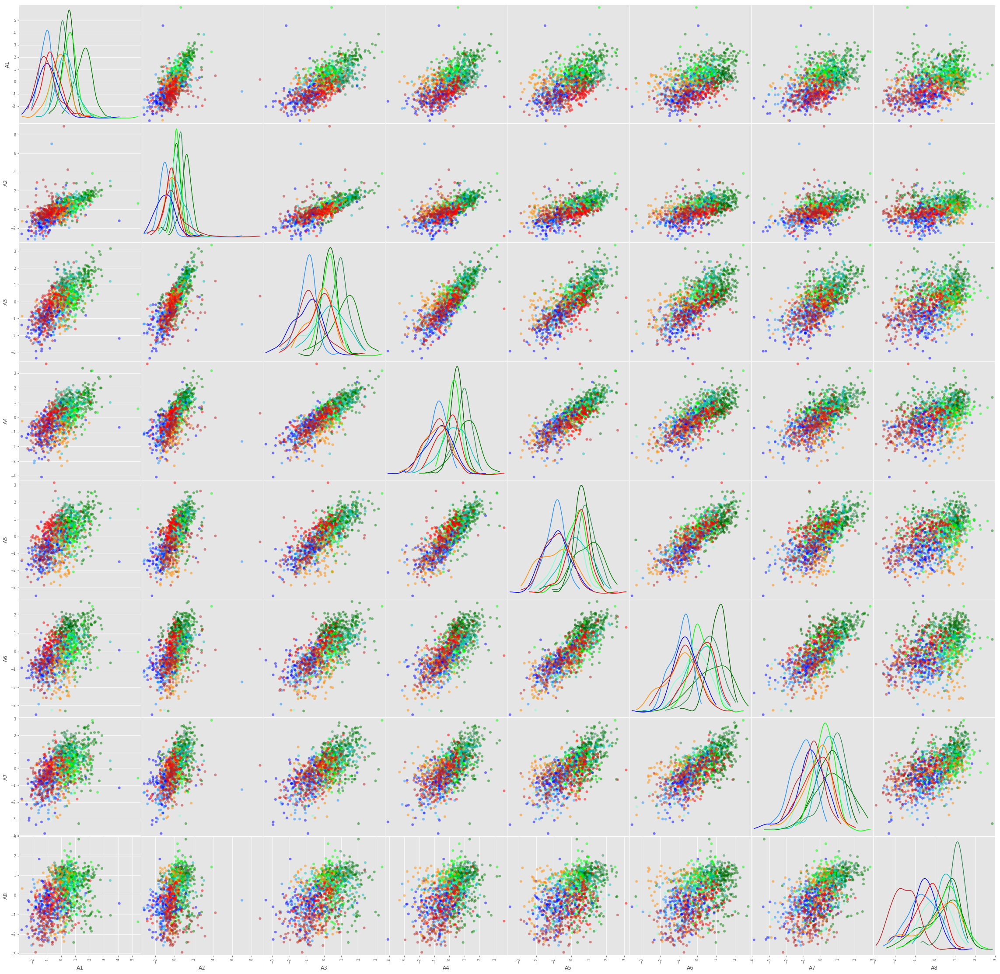

In [14]:
from prettyplot import *
color = ['seagreen','g' ,'darkgreen', 'lime', 'aquamarine', 'c','dodgerblue', 'b', 'darkorange', 'r', 'firebrick']
axarr, color_map = factor_scatter_matrix(allpops,'species', color)
plt.savefig('plots/scatterplotmatrix')

print(color_map)


# Making covariance matrices for all populations (P matrices) 
### By the Cheverud conjecture, we can asssume P and G matrices are similar and possibly interchangable

In [15]:
#a =sns.pairplot(allpops, hue='species', diag_kind="kde", plot_kws=dict(s=10),palette= sns.hls_palette(8, l=.3, s=.8))
#a.set(xticklabels=[])
#a.set(yticklabels=[])

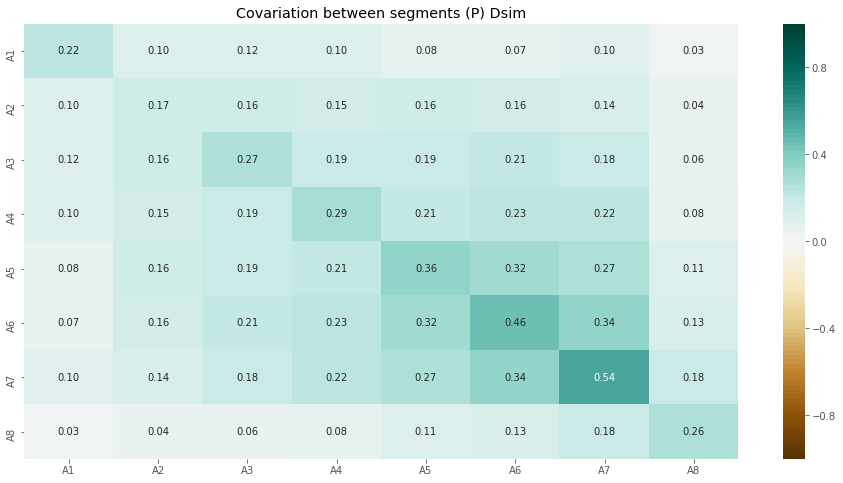

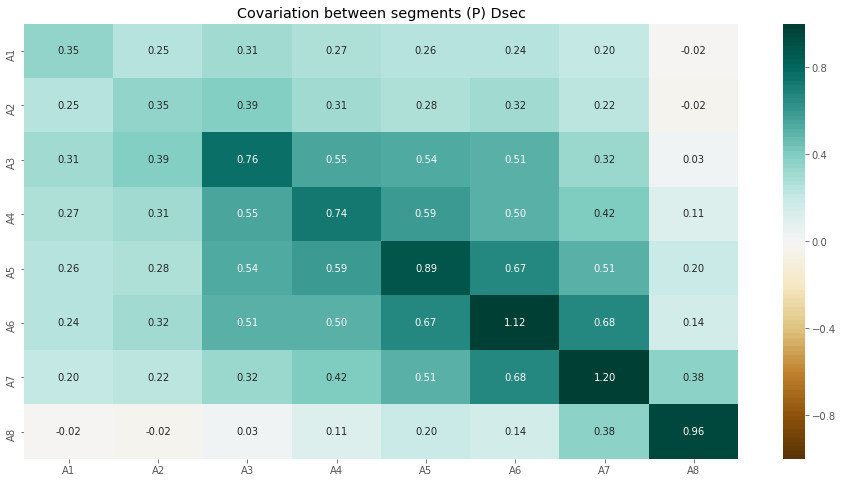

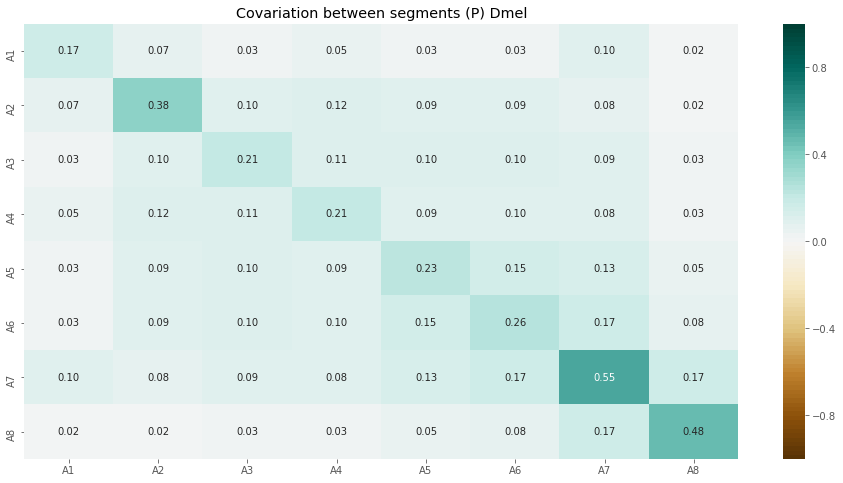

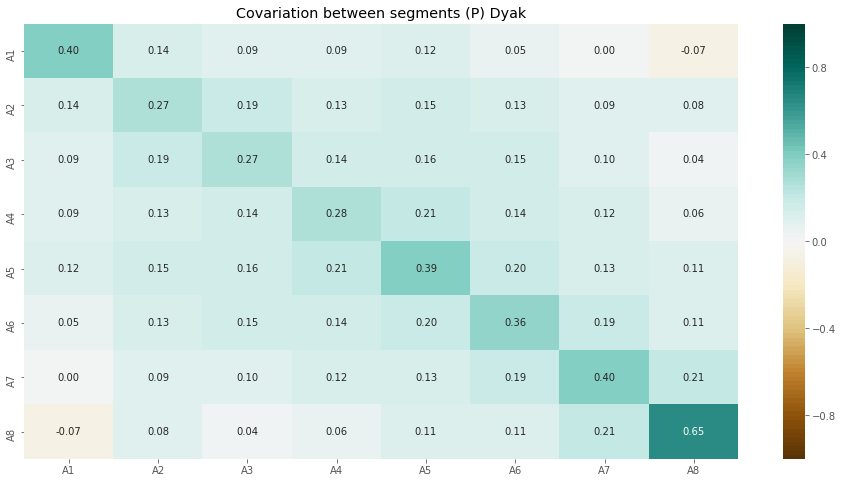

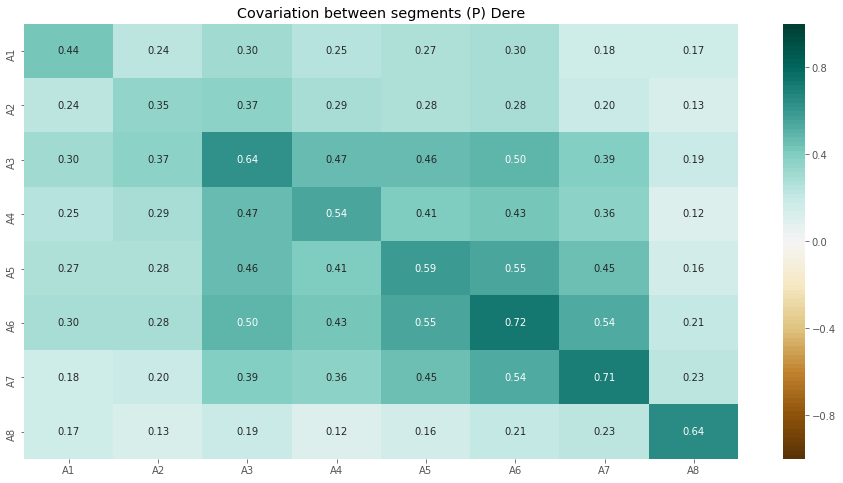

...

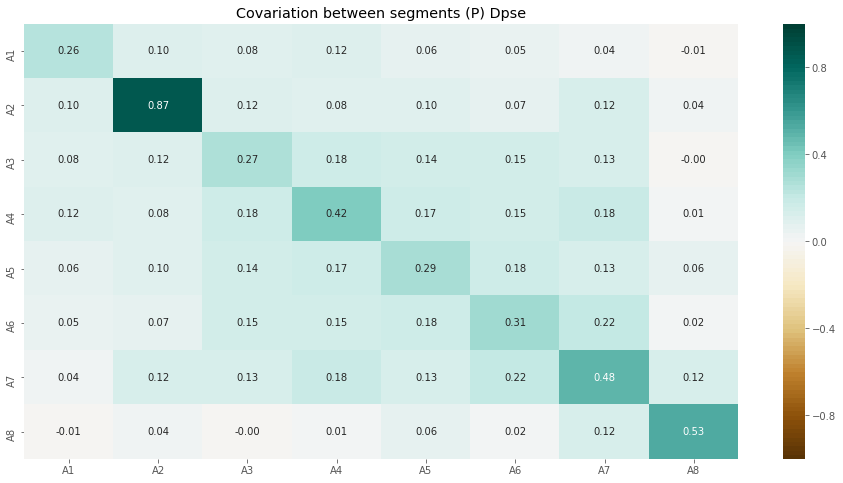

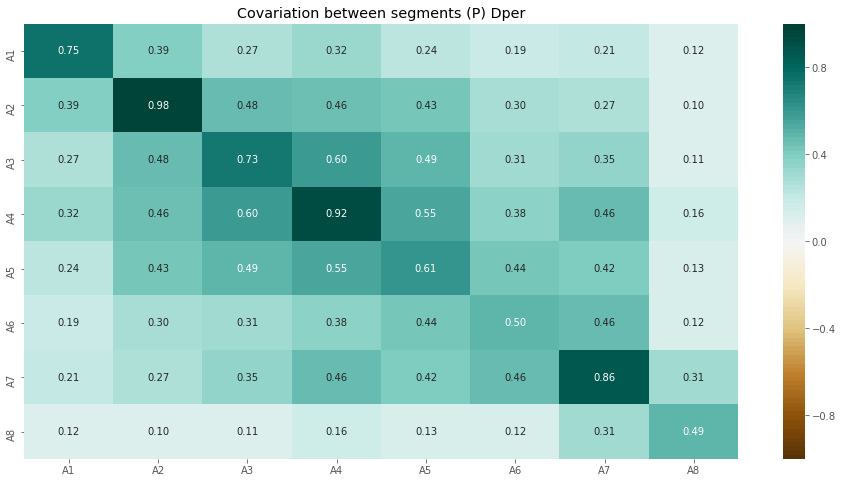

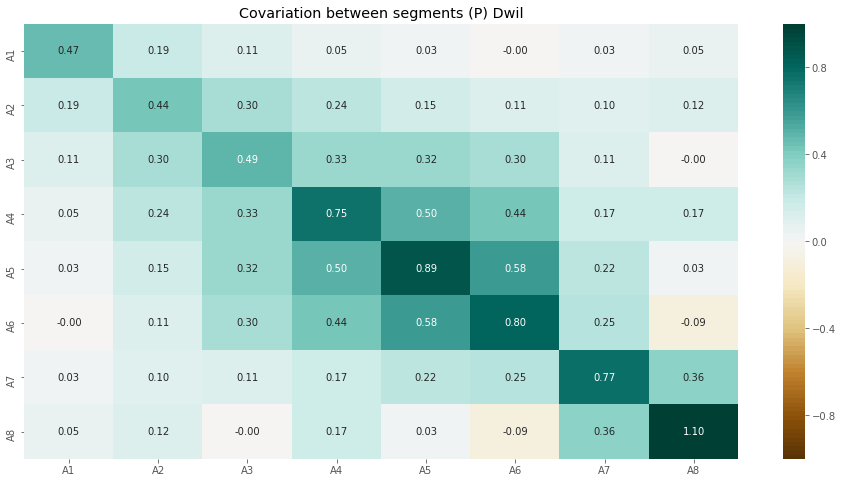

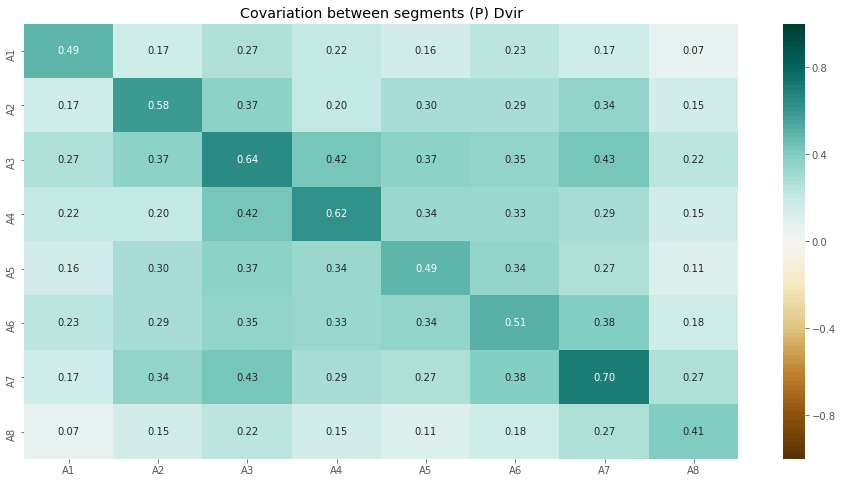

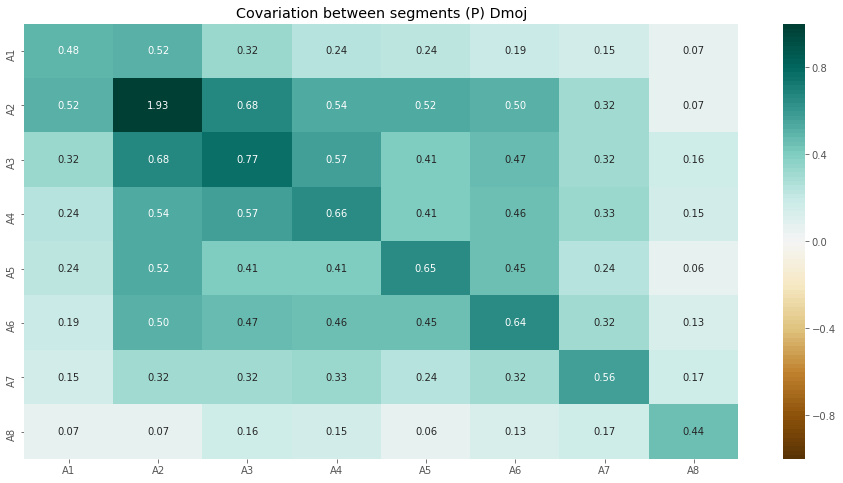

In [16]:
PmatrixAllSpe = {}
for i in species_list:
    sns.heatmap(newpop[i].cov(), annot=True, fmt=".2f",vmin = -1, vmax = 1, cmap=sns.color_palette("BrBG", n_colors=100))
    PmatrixAllSpe[i] = newpop[i].cov()
    plt.title('Covariation between segments (P) '+ i)
    plt.savefig('plots/Covariation between segments '+ i)
    plt.show()
    



# infering  expected ancestral phenotypes

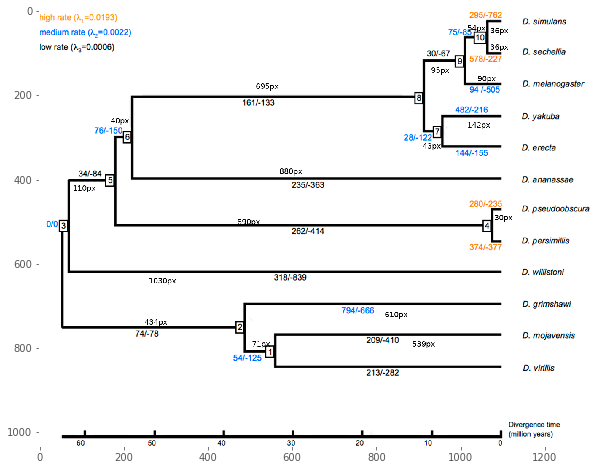

In [17]:
plt.imshow(misc.imread("tree.png"))
plt.grid(False)

### Ancestral Drosophila names

####     SiSe                                                                       1
####     SiSe)Me                                                               2
####     YaEr                                                                       3
####     SiSe)Me)YaEr                                                     4 
####     SiSe)Me)YaEr)An                                               5
####     PsPe                                                                      6   
####     SiSe)Me)YaEr)An)PsPe                                    7 
####     SiSe)Me)YaEr)An)PsPe)Wi                              8
####     ViMo                                                                       9
####     SiSe)Me)YaEr)An)PsPe)Wi)ViMo                  11


In [18]:
MeanPheVectorAncestral = {}
MeanPheVectorAncestral['SiSe'] = (MeanPheVectorAllSpe['Dsim'] + MeanPheVectorAllSpe['Dsec'])/2
MeanPheVectorAncestral['SiSe)Me'] = ((1/54)*MeanPheVectorAncestral['SiSe'] + (1/90)*MeanPheVectorAllSpe['Dmel'])/(1/54+1/90)
MeanPheVectorAncestral['YaEr'] = (MeanPheVectorAllSpe['Dyak'] + MeanPheVectorAllSpe['Dere'])/2
MeanPheVectorAncestral['SiSe)Me)YaEr'] = ((1/95)*MeanPheVectorAncestral['SiSe)Me'] + (1/43)*MeanPheVectorAncestral['YaEr'])/(1/95+1/43)
MeanPheVectorAncestral['SiSe)Me)YaEr)An'] = ((1/695)*MeanPheVectorAncestral['SiSe)Me)YaEr'] + (1/880)*MeanPheVectorAllSpe['Dana'])/(1/695+1/880)
MeanPheVectorAncestral['PsPe'] = (MeanPheVectorAllSpe['Dpse'] + MeanPheVectorAllSpe['Dper'])/2
MeanPheVectorAncestral['SiSe)Me)YaEr)An)PsPe'] = ((1/40)*MeanPheVectorAncestral['SiSe)Me)YaEr)An'] + (1/890)*MeanPheVectorAncestral['PsPe'])/(1/40+1/890)
MeanPheVectorAncestral['SiSe)Me)YaEr)An)PsPe)Wi'] = ((1/110)*MeanPheVectorAncestral['SiSe)Me)YaEr)An)PsPe'] + (1/1030)*MeanPheVectorAllSpe['Dwil'])/(1/110+ 1/1030)
MeanPheVectorAncestral['ViMo'] = (MeanPheVectorAllSpe['Dvir'] + MeanPheVectorAllSpe['Dmoj'])/2
MeanPheVectorAncestral['SiSe)Me)YaEr)An)PsPe)Wi)ViMo'] = ((1/4)*MeanPheVectorAncestral['SiSe)Me)YaEr)An)PsPe)Wi'] + (1/434)*MeanPheVectorAncestral['ViMo'])/(1/434+1/4)




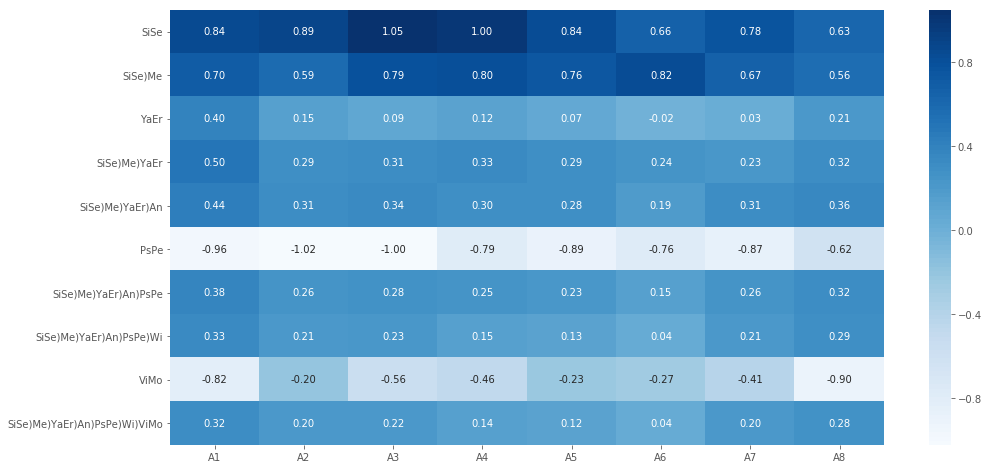

In [19]:

ancestral_spe_list = ["SiSe","SiSe)Me","YaEr","SiSe)Me)YaEr","SiSe)Me)YaEr)An", "PsPe","SiSe)Me)YaEr)An)PsPe","SiSe)Me)YaEr)An)PsPe)Wi", 
                      "ViMo","SiSe)Me)YaEr)An)PsPe)Wi)ViMo"]

MeanPheAncestralDF = pd.DataFrame.from_dict(MeanPheVectorAncestral, orient='index').reindex(ancestral_spe_list)



sns.heatmap( MeanPheAncestralDF,annot=True, fmt=".2f",
               cmap=sns.color_palette("Blues", n_colors=100))    
plt.savefig('plots/clustermap average phenotpe ancestrals')

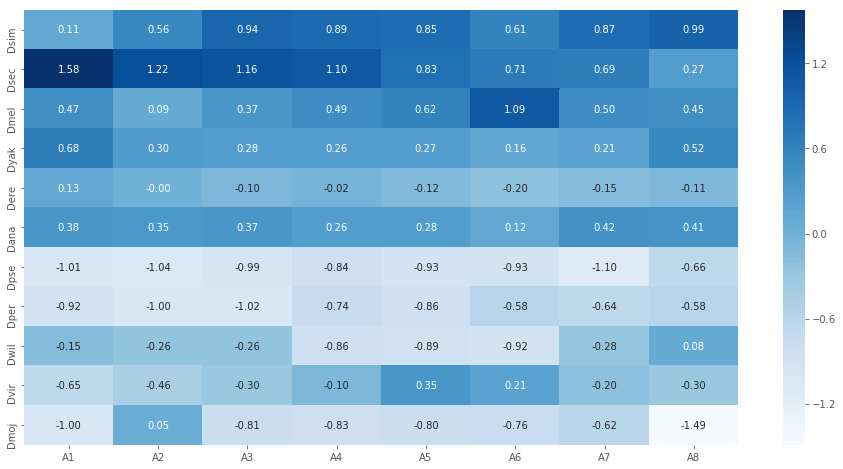

In [20]:
MeanPheAllspeDF = pd.DataFrame.from_dict(MeanPheVectorAllSpe, orient='index').reindex(species_list)
sns.heatmap( MeanPheAllspeDF, annot=True, fmt=".2f",
               cmap=sns.color_palette("Blues", n_colors=100))
plt.savefig('plots/clustermap average phenotype')


# calculating the delta Z for all populations

In [21]:
DeltaZ = {}
DeltaZ['A->Dsec'] = MeanPheVectorAllSpe['Dsec'] - MeanPheVectorAncestral['SiSe']
DeltaZ['A->Dsim'] = MeanPheVectorAllSpe['Dsim'] - MeanPheVectorAncestral['SiSe']
DeltaZ['A->Dpse'] = MeanPheVectorAllSpe['Dpse'] - MeanPheVectorAncestral['PsPe']
DeltaZ['A->Dper'] = MeanPheVectorAllSpe['Dper'] - MeanPheVectorAncestral['PsPe']
DeltaZ['A->Dmel'] = MeanPheVectorAllSpe['Dmel'] - MeanPheVectorAncestral['SiSe)Me']
DeltaZ['A->Dyak'] = MeanPheVectorAllSpe['Dyak'] - MeanPheVectorAncestral['YaEr']
DeltaZ['A->Dere'] = MeanPheVectorAllSpe['Dere'] - MeanPheVectorAncestral['YaEr']
DeltaZ['A->Dmoj'] = MeanPheVectorAllSpe['Dmoj'] - MeanPheVectorAncestral['ViMo']
DeltaZ['A->Dvir'] = MeanPheVectorAllSpe['Dvir'] - MeanPheVectorAncestral['ViMo']
DeltaZ['A->Dwil'] = MeanPheVectorAllSpe['Dwil'] - MeanPheVectorAncestral['SiSe)Me)YaEr)An)PsPe)Wi']
DeltaZ['A->Dana'] = MeanPheVectorAllSpe['Dana'] - MeanPheVectorAncestral['SiSe)Me)YaEr)An']


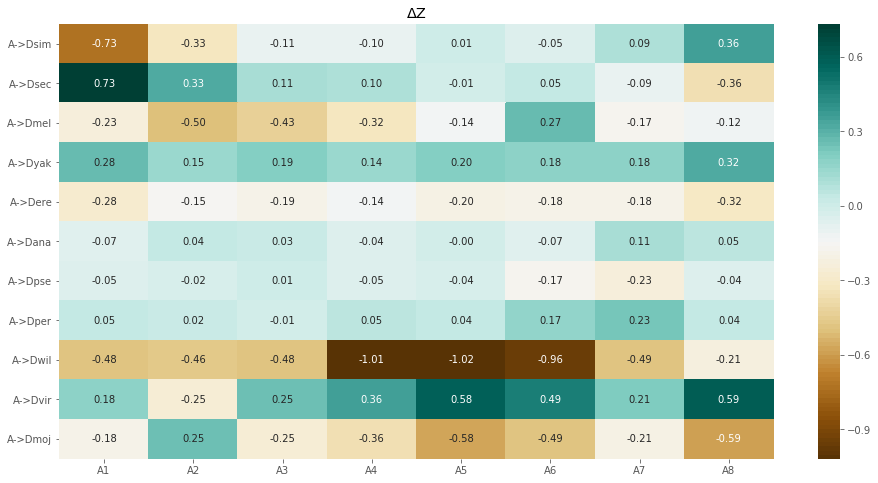

In [22]:
DeltaZDF = pd.DataFrame.from_dict(DeltaZ, orient='index').reindex(['A->' + i for i in species_list])
sns.heatmap( DeltaZDF, annot=True, fmt=".2f",
               cmap=sns.color_palette("BrBG", n_colors=100))
plt.title(r'$\Delta$Z')
plt.savefig('plots/deltaZ heatmap')

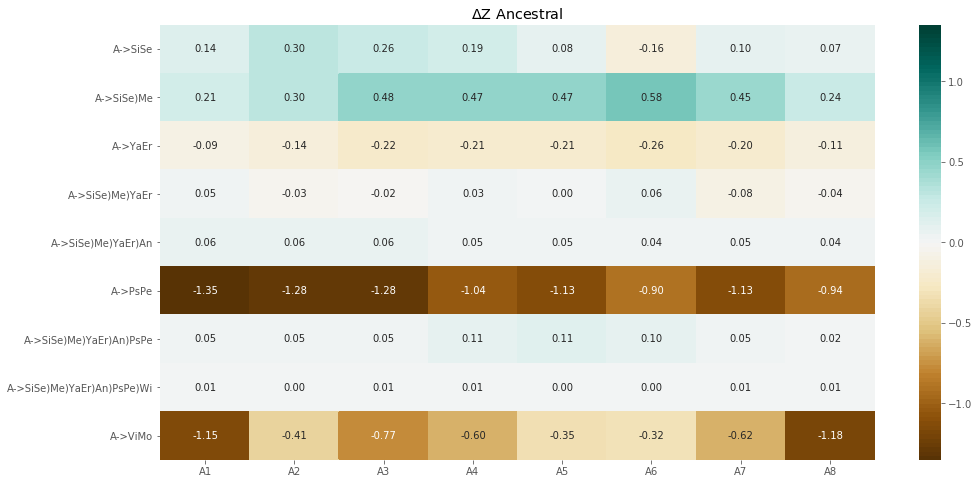

In [23]:
DeltaZA = {}
DeltaZA['A->SiSe'] = MeanPheVectorAncestral['SiSe'] - MeanPheVectorAncestral['SiSe)Me']
DeltaZA['A->SiSe)Me'] = MeanPheVectorAncestral['SiSe)Me'] - MeanPheVectorAncestral['SiSe)Me)YaEr']
DeltaZA['A->YaEr'] = MeanPheVectorAncestral['YaEr'] - MeanPheVectorAncestral['SiSe)Me)YaEr']
DeltaZA['A->SiSe)Me)YaEr'] = MeanPheVectorAncestral['SiSe)Me)YaEr'] - MeanPheVectorAncestral['SiSe)Me)YaEr)An']
DeltaZA['A->SiSe)Me)YaEr)An'] = MeanPheVectorAncestral['SiSe)Me)YaEr)An'] - MeanPheVectorAncestral['SiSe)Me)YaEr)An)PsPe']
DeltaZA['A->PsPe'] = MeanPheVectorAncestral['PsPe'] - MeanPheVectorAncestral['SiSe)Me)YaEr)An)PsPe']
DeltaZA['A->SiSe)Me)YaEr)An)PsPe'] = MeanPheVectorAncestral['SiSe)Me)YaEr)An)PsPe'] - MeanPheVectorAncestral['SiSe)Me)YaEr)An)PsPe)Wi']
DeltaZA['A->SiSe)Me)YaEr)An)PsPe)Wi'] = MeanPheVectorAncestral['SiSe)Me)YaEr)An)PsPe)Wi'] - MeanPheVectorAncestral['SiSe)Me)YaEr)An)PsPe)Wi)ViMo']
DeltaZA['A->ViMo'] = MeanPheVectorAncestral['ViMo'] - MeanPheVectorAncestral['SiSe)Me)YaEr)An)PsPe)Wi)ViMo']

DeltaZAncDF = pd.DataFrame.from_dict(DeltaZA, orient='index').reindex(['A->' + i for i in ancestral_spe_list][:-1])
sns.heatmap( DeltaZAncDF, annot=True, fmt=".2f", vmax = 1.35, vmin = -1.35,
               cmap=sns.color_palette("BrBG", n_colors=100)) #vmax = 3000, vmin = -3000,
plt.title(r'$\Delta$Z Ancestral')
plt.savefig('plots/deltaZ Ancestral heatmap')

# calculating ancestral P matrices



In [24]:
PAncestral = {}
PAncestral['SiSe'] = (PmatrixAllSpe['Dsim'] + PmatrixAllSpe['Dsec'])/2
PAncestral['SiSe)Me'] = ((1/54)*PAncestral['SiSe'] + (1/90)*PmatrixAllSpe['Dmel'])/(1/54+1/90)
PAncestral['YaEr'] = (PmatrixAllSpe['Dyak'] + PmatrixAllSpe['Dere'])/2
PAncestral['SiSe)Me)YaEr'] = ((1/95)*PAncestral['SiSe)Me'] + (1/43)*PAncestral['YaEr'])/(1/95+1/43)
PAncestral['SiSe)Me)YaEr)An'] = ((1/695)*PAncestral['SiSe)Me)YaEr'] + (1/880)*PmatrixAllSpe['Dana'])/(1/695+1/880)
PAncestral['PsPe'] = (PmatrixAllSpe['Dpse'] +PmatrixAllSpe['Dper'])/2
PAncestral['SiSe)Me)YaEr)An)PsPe'] = ((1/40)*PAncestral['SiSe)Me)YaEr)An'] + (1/890)*PAncestral['PsPe'])/(1/40+1/890)
PAncestral['SiSe)Me)YaEr)An)PsPe)Wi'] = ((1/110)*PAncestral['SiSe)Me)YaEr)An)PsPe'] + (1/1030)*PmatrixAllSpe['Dwil'])/(1/110+ 1/1030)
PAncestral['ViMo'] = (PmatrixAllSpe['Dvir'] + PmatrixAllSpe['Dmoj'])/2
PAncestral['SiSe)Me)YaEr)An)PsPe)Wi)ViMo'] = ((1/4)*PAncestral['SiSe)Me)YaEr)An)PsPe)Wi'] + (1/434)*PAncestral['ViMo'])/(1/434+1/4)



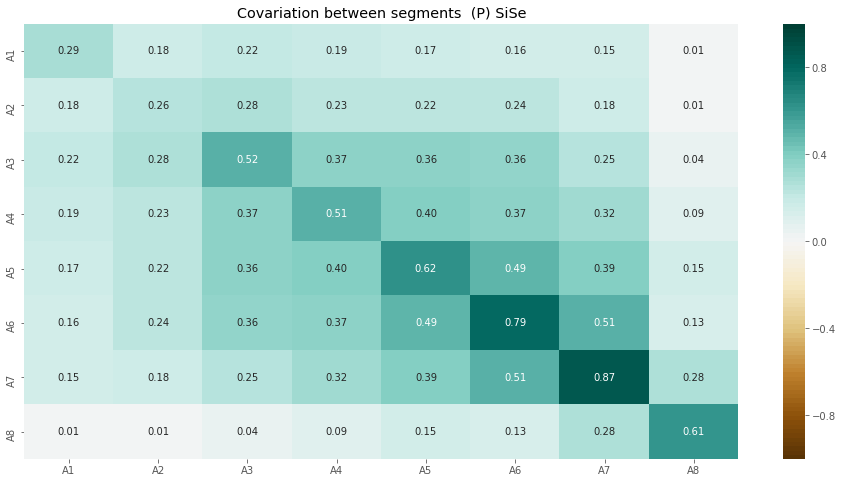

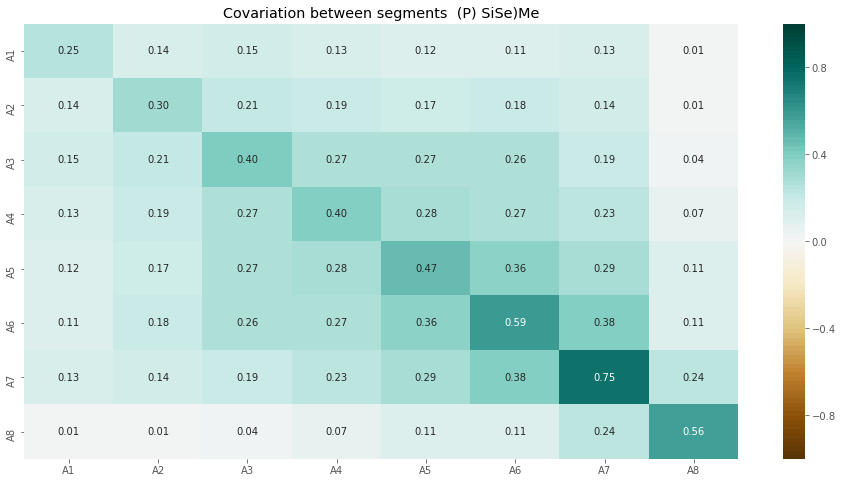

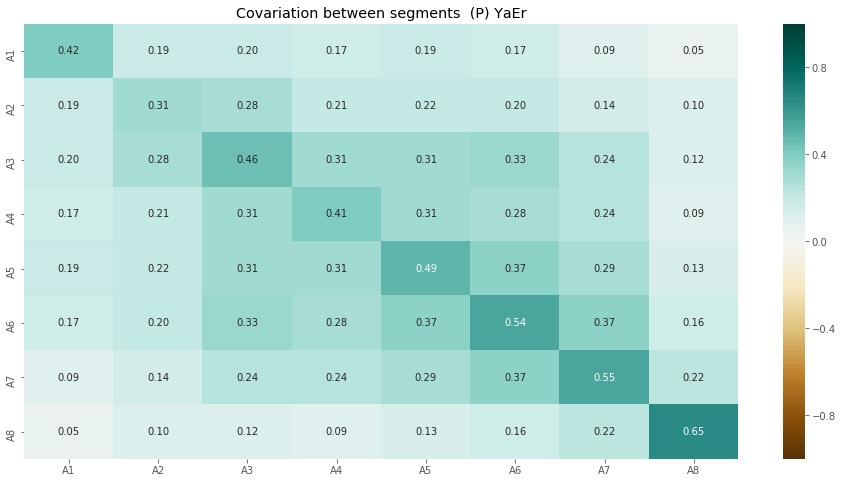

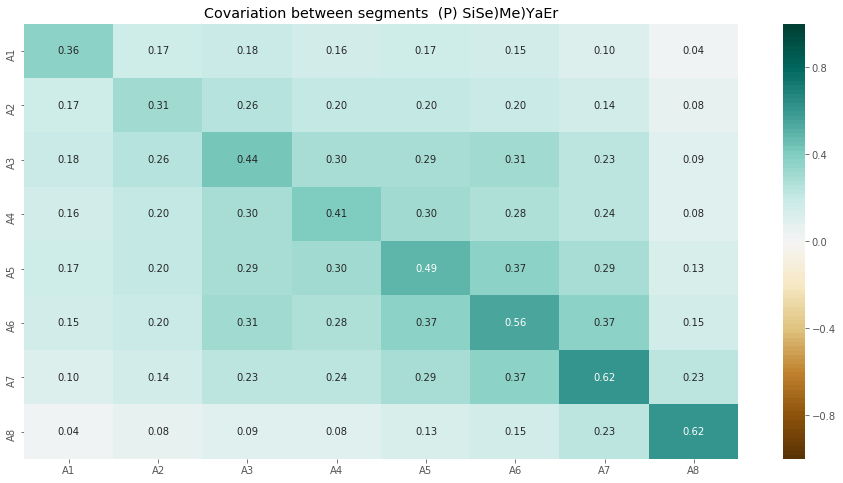

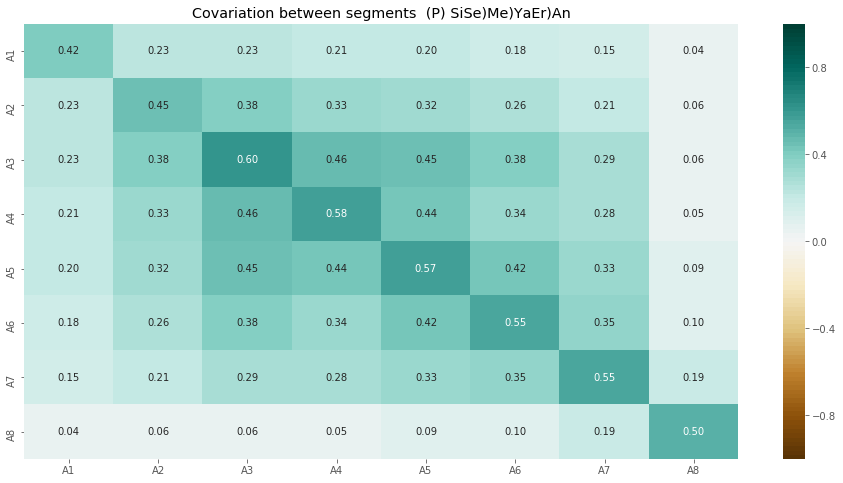

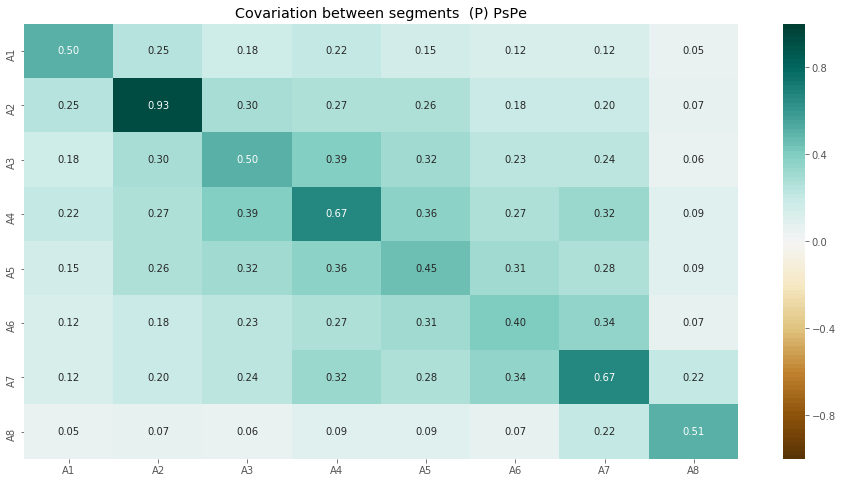

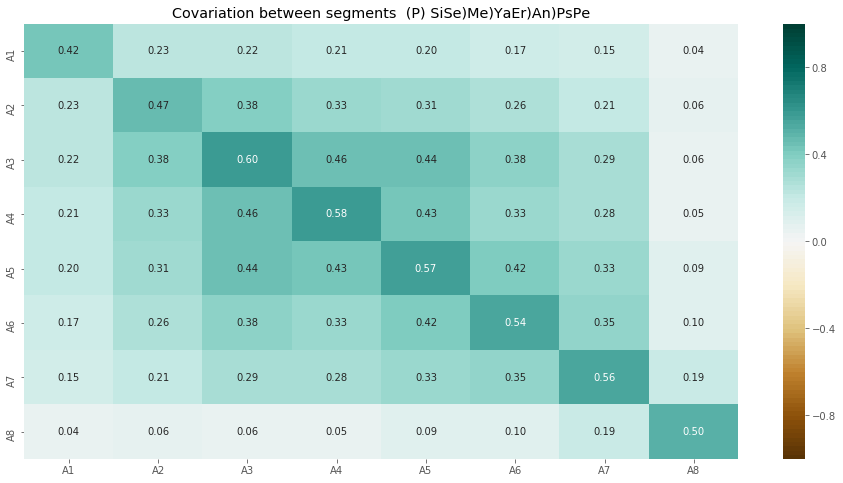

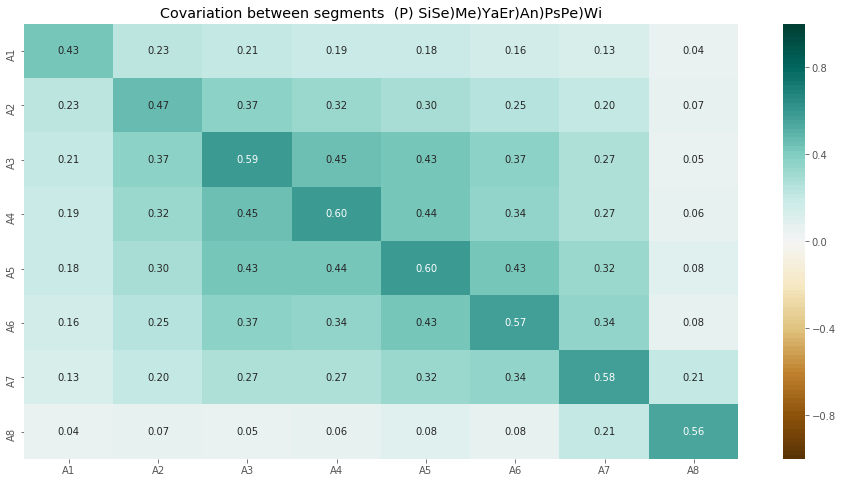

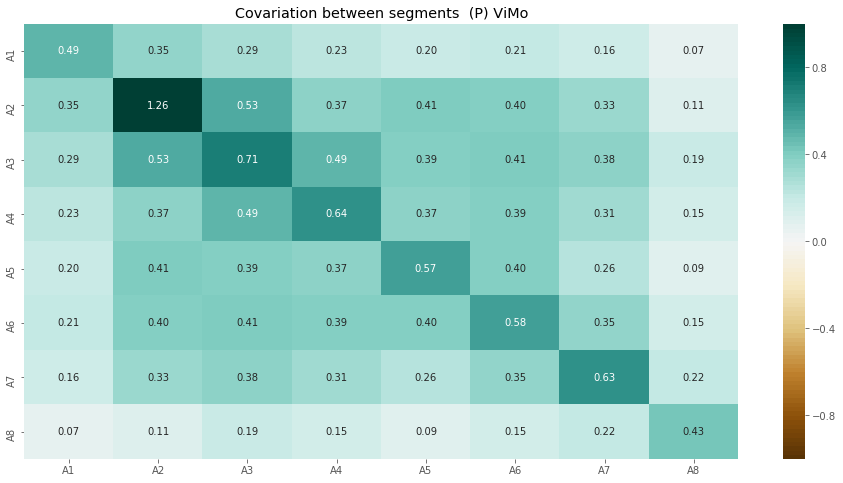

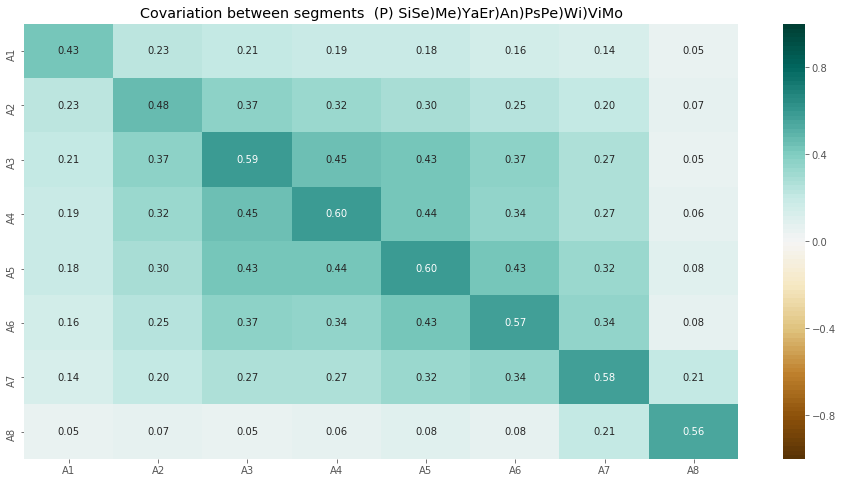

In [25]:
for i in ancestral_spe_list:
    sns.heatmap(PAncestral[i], annot=True, fmt=".2f",vmin = -1, vmax = 1, cmap=sns.color_palette("BrBG", n_colors=100))
    plt.title('Covariation between segments  (P) '+ i)
    plt.savefig('plots/Covariation between segments '+ i)
    plt.show()

# calculating selection gradients $\beta$

## curent lineages $\beta$

In [26]:
betaselection = {}
betaselection['A->Dsec'] = pd.DataFrame(np.linalg.pinv(PAncestral['SiSe'].values),
                                        PAncestral['SiSe'].columns, PAncestral['SiSe'].index).dot(DeltaZ['A->Dsec'])
betaselection['A->Dsim'] = pd.DataFrame(np.linalg.pinv(PAncestral['SiSe'].values),
                                        PAncestral['SiSe'].columns, PAncestral['SiSe'].index).dot(DeltaZ['A->Dsim'])
betaselection['A->Dpse'] = pd.DataFrame(np.linalg.pinv(PAncestral['PsPe'].values),
                                        PAncestral['PsPe'].columns, PAncestral['PsPe'].index).dot(DeltaZ['A->Dpse'])
betaselection['A->Dper'] = pd.DataFrame(np.linalg.pinv(PAncestral['PsPe'].values),
                                        PAncestral['PsPe'].columns, PAncestral['PsPe'].index).dot(DeltaZ['A->Dper'])
betaselection['A->Dmel'] = pd.DataFrame(np.linalg.pinv(PAncestral['SiSe)Me'].values),
                                        PAncestral['SiSe)Me'].columns, PAncestral['SiSe)Me'].index).dot(DeltaZ['A->Dmel'])
betaselection['A->Dyak'] = pd.DataFrame(np.linalg.pinv(PAncestral['YaEr'].values),
                                        PAncestral['YaEr'].columns, PAncestral['YaEr'].index).dot(DeltaZ['A->Dyak'])
betaselection['A->Dere'] = pd.DataFrame(np.linalg.pinv(PAncestral['YaEr'].values),
                                        PAncestral['YaEr'].columns, PAncestral['YaEr'].index).dot(DeltaZ['A->Dere'])
betaselection['A->Dmoj'] = pd.DataFrame(np.linalg.pinv(PAncestral['ViMo'].values),
                                        PAncestral['ViMo'].columns, PAncestral['ViMo'].index).dot(DeltaZ['A->Dmoj'])
betaselection['A->Dvir'] = pd.DataFrame(np.linalg.pinv(PAncestral['ViMo'].values),
                                        PAncestral['ViMo'].columns, PAncestral['ViMo'].index).dot(DeltaZ['A->Dvir'])
betaselection['A->Dwil'] = pd.DataFrame(np.linalg.pinv(PAncestral['SiSe)Me)YaEr)An)PsPe)Wi'].values),
                                        PAncestral['SiSe)Me)YaEr)An)PsPe)Wi'].columns, 
                                        PAncestral['SiSe)Me)YaEr)An)PsPe)Wi'].index).dot(DeltaZ['A->Dwil'])
betaselection['A->Dana'] = pd.DataFrame(np.linalg.pinv(PAncestral['SiSe)Me)YaEr)An'].values),
                                        PAncestral['SiSe)Me)YaEr)An'].columns, PAncestral['SiSe)Me)YaEr)An'].index).dot(DeltaZ['A->Dana'])




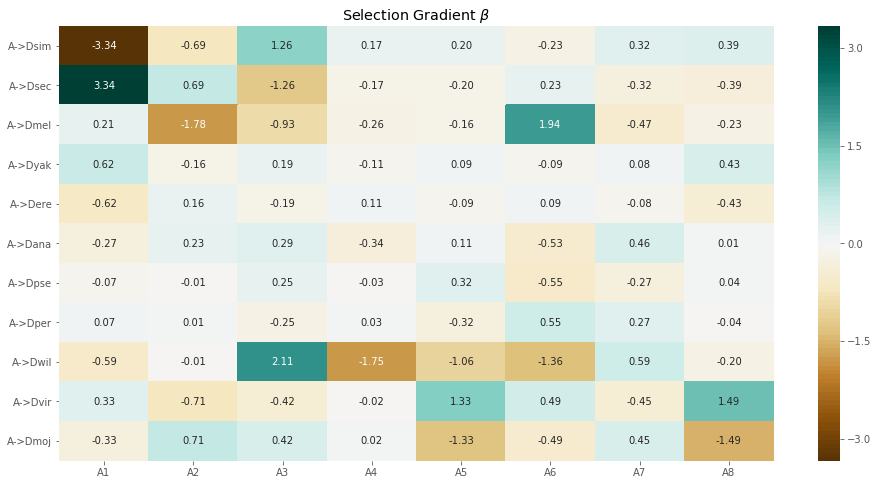

In [27]:
betadf = pd.DataFrame.from_dict(betaselection, orient='index').reindex(['A->' + i for i in species_list])
sns.heatmap( betadf, annot=True, fmt=".2f",
               cmap=sns.color_palette("BrBG", n_colors=100))
plt.title(r'Selection Gradient $\beta$')
plt.savefig('plots/selection gradient curent pop')

## ancestral $\beta$

In [28]:
betaancestral ={}
betaancestral['A->SiSe'] = pd.DataFrame(np.linalg.pinv(PAncestral['SiSe)Me'].values),
                                        PAncestral['SiSe)Me'].columns, PAncestral['SiSe)Me'].index).dot(DeltaZA['A->SiSe'])
betaancestral['A->SiSe)Me'] = pd.DataFrame(np.linalg.pinv(PAncestral['SiSe)Me)YaEr'].values),
                                        PAncestral['SiSe)Me)YaEr'].columns, PAncestral['SiSe)Me)YaEr'].index).dot(DeltaZA['A->SiSe)Me'])
betaancestral['A->YaEr'] = pd.DataFrame(np.linalg.pinv(PAncestral['SiSe)Me)YaEr'].values),
                                        PAncestral['SiSe)Me)YaEr'].columns, PAncestral['SiSe)Me)YaEr'].index).dot(DeltaZA['A->YaEr'])
betaancestral['A->SiSe)Me)YaEr'] = pd.DataFrame(np.linalg.pinv(PAncestral['SiSe)Me)YaEr)An'].values),
                                        PAncestral['SiSe)Me)YaEr)An'].columns, PAncestral['SiSe)Me)YaEr)An'].index).dot(DeltaZA['A->SiSe)Me)YaEr'])
betaancestral['A->SiSe)Me)YaEr)An'] = pd.DataFrame(np.linalg.pinv(PAncestral['SiSe)Me)YaEr)An)PsPe'].values),
                                        PAncestral['SiSe)Me)YaEr)An)PsPe'].columns, PAncestral['SiSe)Me)YaEr)An)PsPe'].index).dot(DeltaZA['A->SiSe)Me)YaEr)An'])
betaancestral['A->PsPe'] = pd.DataFrame(np.linalg.pinv(PAncestral['SiSe)Me)YaEr)An)PsPe'].values),
                                        PAncestral['SiSe)Me)YaEr)An)PsPe'].columns, PAncestral['SiSe)Me)YaEr)An)PsPe'].index).dot(DeltaZA['A->PsPe'])
betaancestral['A->SiSe)Me)YaEr)An)PsPe'] = pd.DataFrame(np.linalg.pinv(PAncestral['SiSe)Me)YaEr)An)PsPe)Wi'].values),
                                        PAncestral['SiSe)Me)YaEr)An)PsPe)Wi'].columns, PAncestral['SiSe)Me)YaEr)An)PsPe)Wi'].index).dot(DeltaZA['A->SiSe)Me)YaEr)An)PsPe'])
betaancestral['A->SiSe)Me)YaEr)An)PsPe)Wi'] = pd.DataFrame(np.linalg.pinv(PAncestral['SiSe)Me)YaEr)An)PsPe)Wi)ViMo'].values),
                                        PAncestral['SiSe)Me)YaEr)An)PsPe)Wi)ViMo'].columns, PAncestral['SiSe)Me)YaEr)An)PsPe)Wi)ViMo'].index).dot(DeltaZA['A->SiSe)Me)YaEr)An)PsPe)Wi'])
betaancestral['A->ViMo'] = pd.DataFrame(np.linalg.pinv(PAncestral['SiSe)Me)YaEr)An)PsPe)Wi)ViMo'].values),
                                        PAncestral['SiSe)Me)YaEr)An)PsPe)Wi)ViMo'].columns, PAncestral['SiSe)Me)YaEr)An)PsPe)Wi)ViMo'].index).dot(DeltaZA['A->ViMo'])

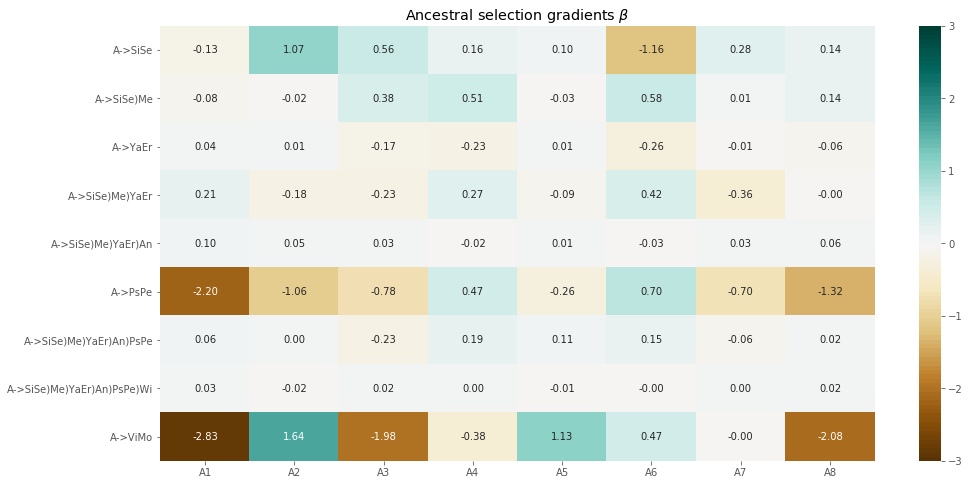

In [29]:
betaAncdf = pd.DataFrame.from_dict(betaancestral, orient='index').reindex(['A->' + i for i in ancestral_spe_list][:-1])
sns.heatmap( betaAncdf, annot=True, fmt=".2f", vmax= 3, vmin = -3,
               cmap=sns.color_palette("BrBG", n_colors=100))
plt.title(r'Ancestral selection gradients $\beta$')
plt.savefig('plots/Ancestral selection gradients')

# calculating PCs and components for every population

In [30]:

from sklearn.decomposition import PCA as sklearnPCA

class PCana:
    def __init__(self, segmentsDF):
        sklearn_pca = sklearnPCA(n_components=4)
        self.PCvalues = sklearn_pca.fit_transform(segmentsDF.values)
        self.varEXP = sklearn_pca.explained_variance_ratio_
        self.PCAComp = sklearn_pca.components_
        
        
        
PCAAllSpe = {}
for i in species_list:
    PCAAllSpe[i] = PCana(newpop[i].iloc[:, :-1])

In [31]:
Amatrix = np.hstack((PCAAllSpe[species_list[0]].PCAComp[:3],np.asmatrix(PCAAllSpe[species_list[0]].varEXP[:3]).T))

for spe in species_list[1:]:
    temp = np.hstack((PCAAllSpe[spe].PCAComp[:3],np.asmatrix(PCAAllSpe[spe].varEXP[:3]).T))
    Amatrix = np.vstack((Amatrix, temp))
    
PCACompPd = pd.DataFrame(Amatrix, columns=['A'+ str(i) for i in range(1,9)] + ['Explained variance'], index = ['PC'+ str(i)+' ' +spe for spe in species_list for i in range(1,4)])
PCACompPd.head()

,A1,A2,A3,A4,A5,A6,A7,A8,Explained variance
PC1 Dsim,-0.167287,-0.247759,-0.319590,-0.347641,-0.414132,-0.480054,-0.495796,-0.199668,0.601838
PC2 Dsim,0.403123,0.326993,0.428836,0.266017,0.043854,-0.116740,-0.502271,-0.456152,0.126243
PC3 Dsim,0.615778,0.053770,0.077216,0.006431,-0.343354,-0.470497,0.274559,0.444163,0.085192
PC1 Dsec,-0.191459,-0.220850,-0.367445,-0.380046,-0.437792,-0.480942,-0.436414,-0.147290,0.537219
PC2 Dsec,0.188299,0.216895,0.318918,0.183937,0.069397,0.017084,-0.454675,-0.755064,0.178452


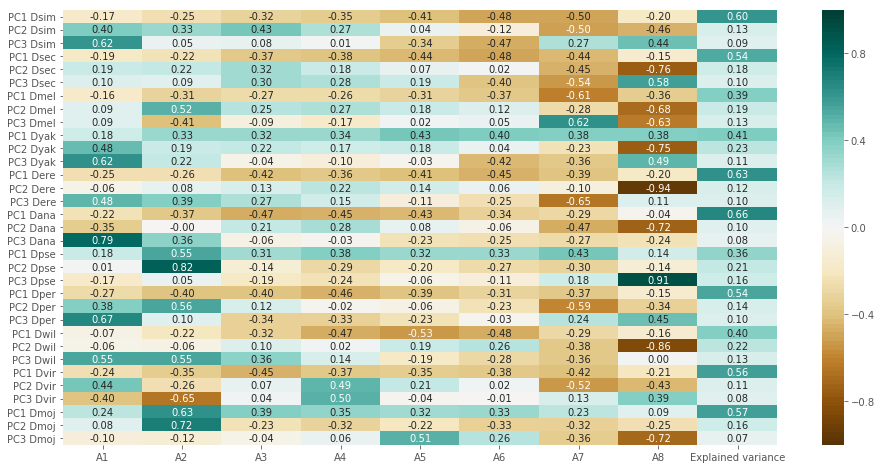

In [32]:
sns.heatmap(PCACompPd, annot=True, fmt=".2f",vmin = -1, vmax = 1, cmap=sns.color_palette("BrBG", n_colors=100))
plt.savefig('plots/PCs good heatmap')

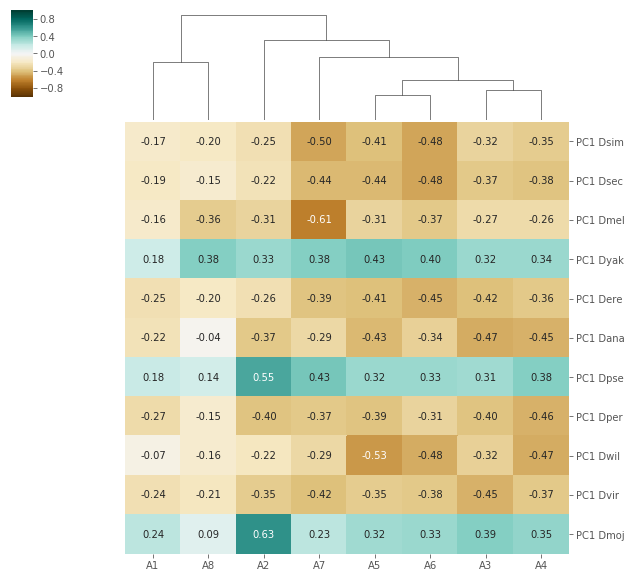

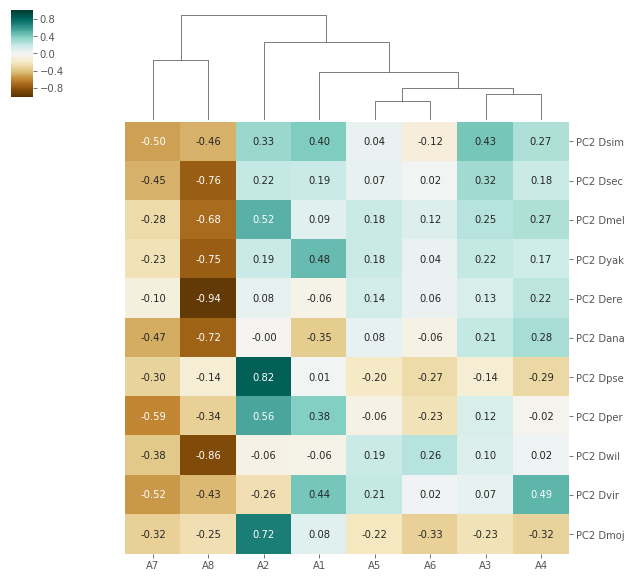

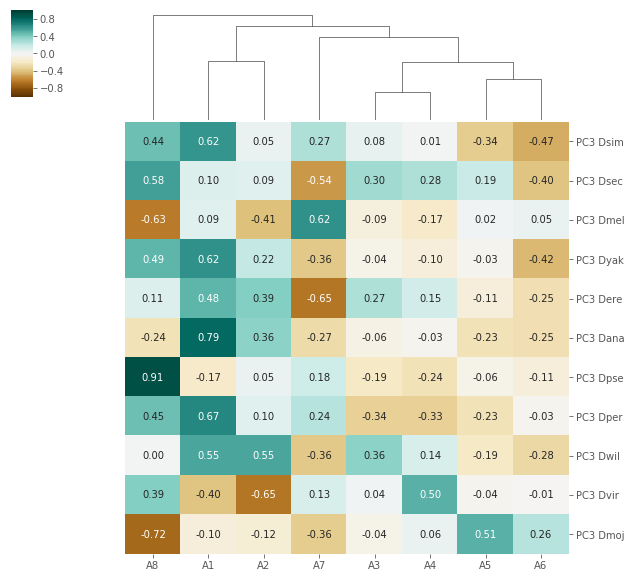

In [33]:
for i in [0,1,2]:
    sns.clustermap(PCACompPd.iloc[i::3, :-1] , annot=True, fmt=".2f",vmin = -1, vmax = 1,row_cluster = False, cmap=sns.color_palette("BrBG", n_colors=100), figsize=(10, 10))
    plt.savefig('plots/clustermap good for PC'+ str(i)+'.png')